In [1]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin/'

import random
from time import time

import math
import numpy as np
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline

import hvplot.pandas

plt.style.use("ggplot")
#plt.style.use("fivethirtyeight")

dot_file_path = 'D:/TreeChart/decision_tree.dot'

from functools import reduce

# Warnings
import warnings 
warnings.filterwarnings('ignore')

In [2]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.svm import SVC

from sklearn.preprocessing import LabelEncoder, StandardScaler

from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, roc_curve, auc

from sklearn import model_selection

from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold, RepeatedStratifiedKFold, cross_val_score

import graphviz
from sklearn import tree

In [3]:
def set_seed(seed_value):
    random.seed(seed_value)
    np.random.seed(seed_value)
    os.environ["PYTHONHASHSEED"] = str(seed_value)

In [4]:
SEED = 42
set_seed(SEED)

In [5]:
df_data = pd.read_csv("Task_2//data.csv")
df_data.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [6]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [7]:
df_data.shape

(569, 33)

In [8]:
df_data.isna().sum()

id                           0
diagnosis                    0
radius_mean                  0
texture_mean                 0
perimeter_mean               0
area_mean                    0
smoothness_mean              0
compactness_mean             0
concavity_mean               0
concave points_mean          0
symmetry_mean                0
fractal_dimension_mean       0
radius_se                    0
texture_se                   0
perimeter_se                 0
area_se                      0
smoothness_se                0
compactness_se               0
concavity_se                 0
concave points_se            0
symmetry_se                  0
fractal_dimension_se         0
radius_worst                 0
texture_worst                0
perimeter_worst              0
area_worst                   0
smoothness_worst             0
compactness_worst            0
concavity_worst              0
concave points_worst         0
symmetry_worst               0
fractal_dimension_worst      0
Unnamed:

In [9]:
# column 'id' & 'Unnamed: 32' will be excluded from the analysis
df_data.drop(columns=['id','Unnamed: 32'], axis=1, inplace=True)

In [10]:
df_data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

Count of cells labeled as Benign:  357
Count of cells labeled as Malignant:  212 

Percentage of cells labeled Benign:  62.74 %
Percentage of cells labeled Malignant:  37.26 %


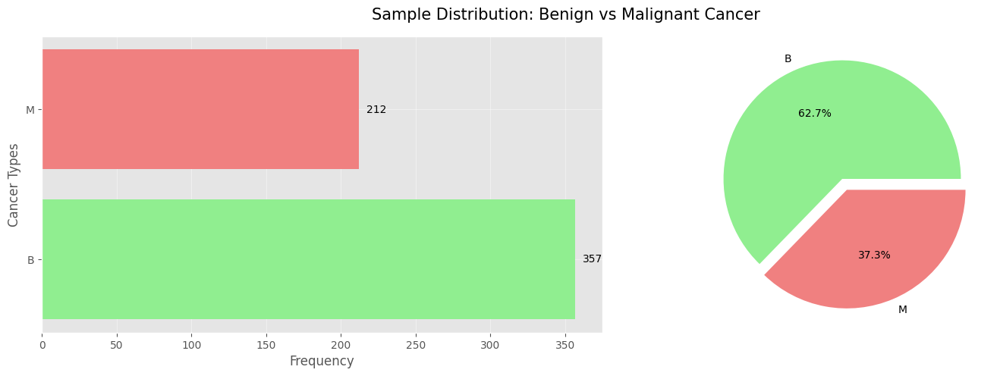

In [11]:
# distribution of samples by the cancer types (B=Benign vs M=Malignant)

#benign = gentle, kind, mild, or not harmful
#Malignant = is harmful, dangerous, or has the potential to cause serious harm

types = df_data['diagnosis'].value_counts()

print("Count of cells labeled as Benign: ", types[0])
print("Count of cells labeled as Malignant: ", types[1], '\n')

print("Percentage of cells labeled Benign: ", round(( types[0] / len(df_data) )* 100, 2), '%')
print("Percentage of cells labeled Malignant: ", round(( types[1] / len(df_data) )* 100, 2), '%')

colors = ['lightgreen','lightcoral']

# visualization (bar chart and pie chart)
figure, axes = plt.subplots(1,2, figsize=(15,5))
axes[0].barh(y=types.index, width=types.values, color=colors)
axes[0].set_xlabel('Frequency')
axes[0].set_ylabel('Cancer Types')
axes[0].grid(alpha=0.4)

for index, values in enumerate(types):
    axes[0].text(values+5, index, str(values), va='center')
    
axes[1].pie(types.values, labels=types.index, explode=([0.05]*len(types.index)), colors=colors, autopct='%.1f%%')
figure.suptitle('Sample Distribution: Benign vs Malignant Cancer', fontsize=15)
plt.tight_layout(pad=1)
plt.show()

In [12]:
df_data.describe().T

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


In [13]:
df_data.nunique()

diagnosis                    2
radius_mean                456
texture_mean               479
perimeter_mean             522
area_mean                  539
smoothness_mean            474
compactness_mean           537
concavity_mean             537
concave points_mean        542
symmetry_mean              432
fractal_dimension_mean     499
radius_se                  540
texture_se                 519
perimeter_se               533
area_se                    528
smoothness_se              547
compactness_se             541
concavity_se               533
concave points_se          507
symmetry_se                498
fractal_dimension_se       545
radius_worst               457
texture_worst              511
perimeter_worst            514
area_worst                 544
smoothness_worst           411
compactness_worst          529
concavity_worst            539
concave points_worst       492
symmetry_worst             500
fractal_dimension_worst    535
dtype: int64

# Visualization

In [14]:
df_data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [15]:
len(df_data.columns)

31

In [16]:
df_data1 = df_data[['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean']]

df_data2 = df_data[['diagnosis', 'fractal_dimension_mean', 'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se']]

df_data3 = df_data[['diagnosis', 'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']]

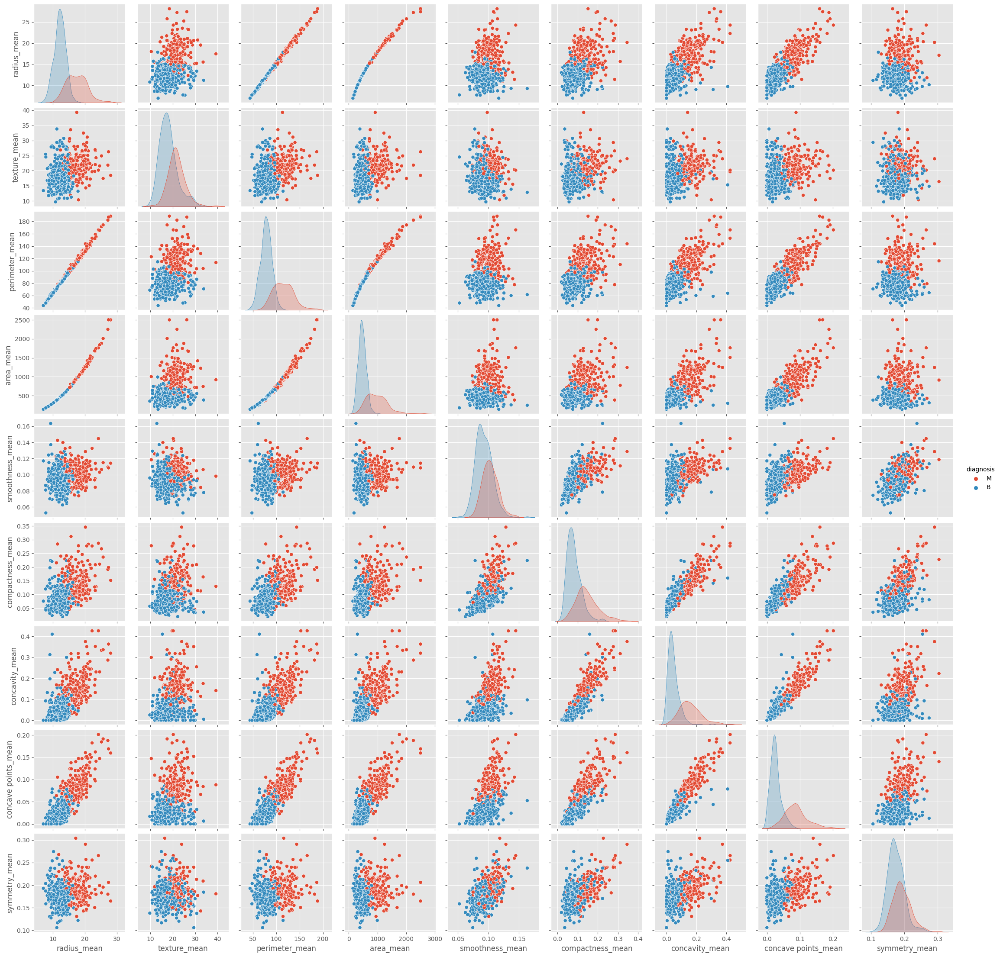

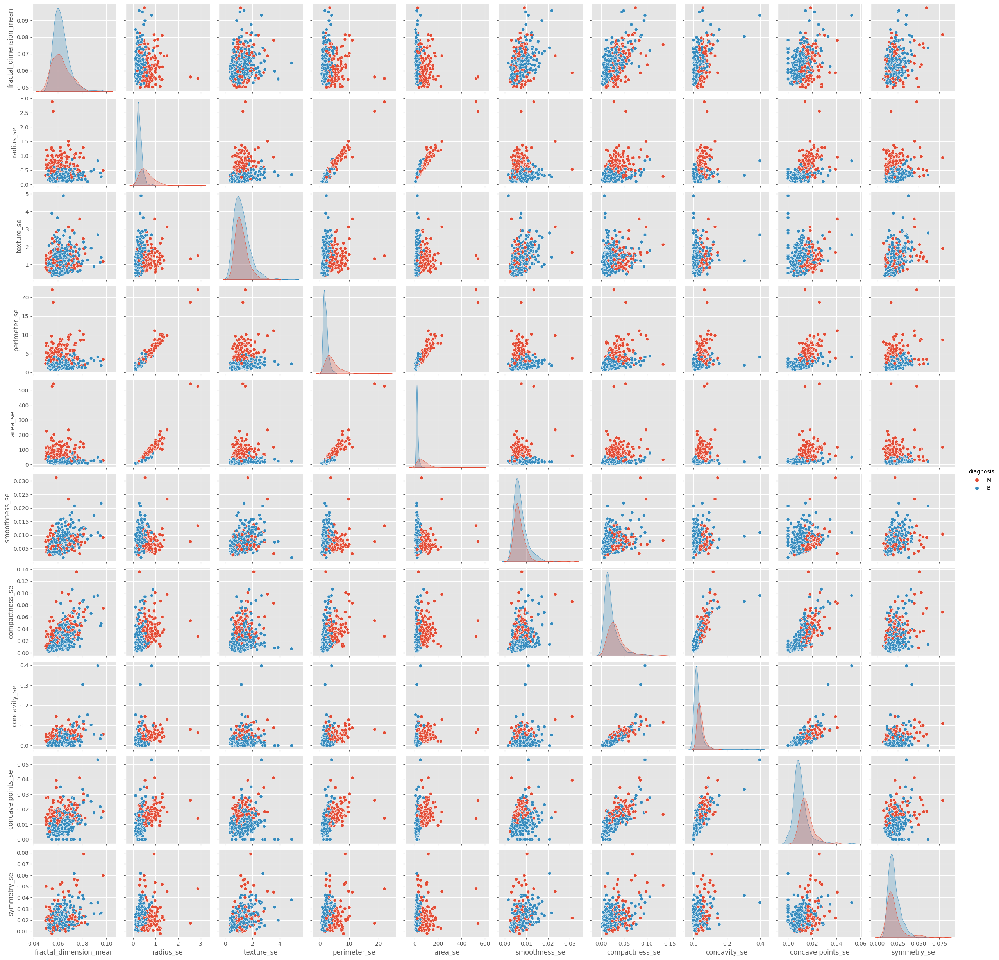

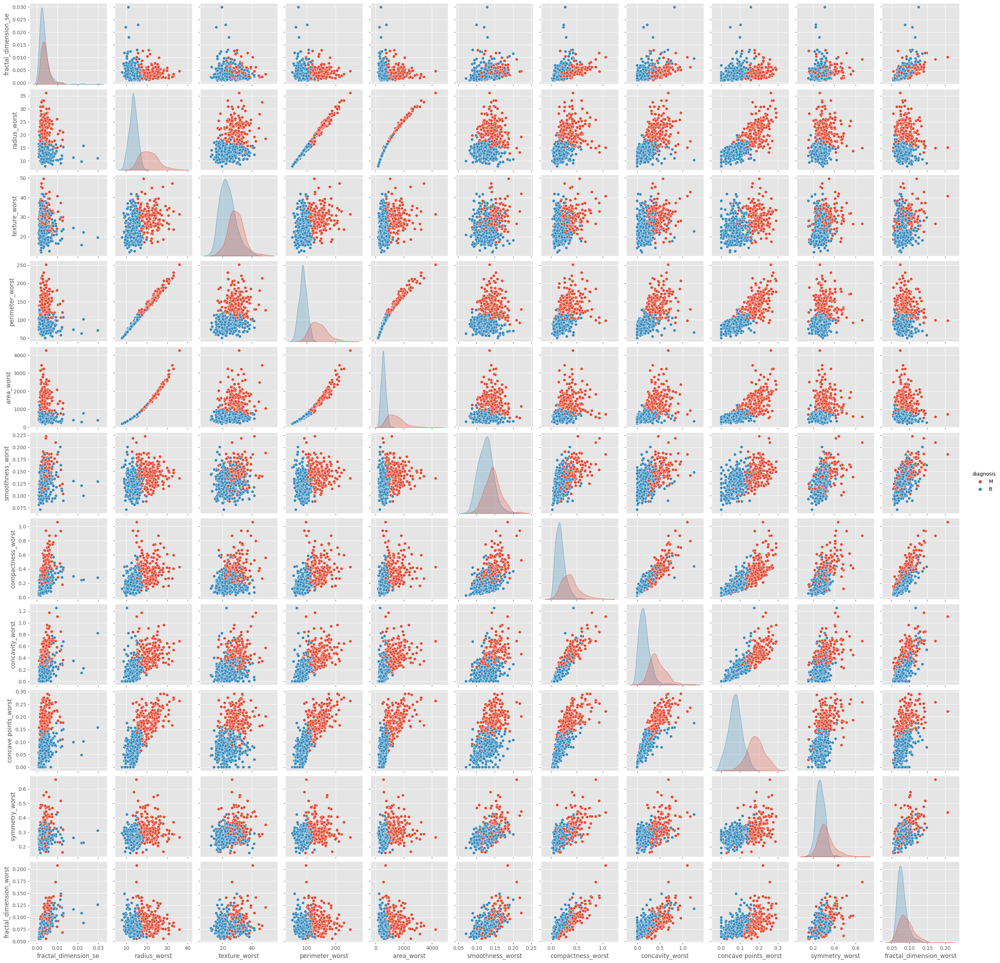

In [17]:
sns.pairplot(df_data1, hue='diagnosis')

sns.pairplot(df_data2, hue='diagnosis')

sns.pairplot(df_data3, hue='diagnosis')
plt.show()

In [18]:
df_data.iloc[:,1:]

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


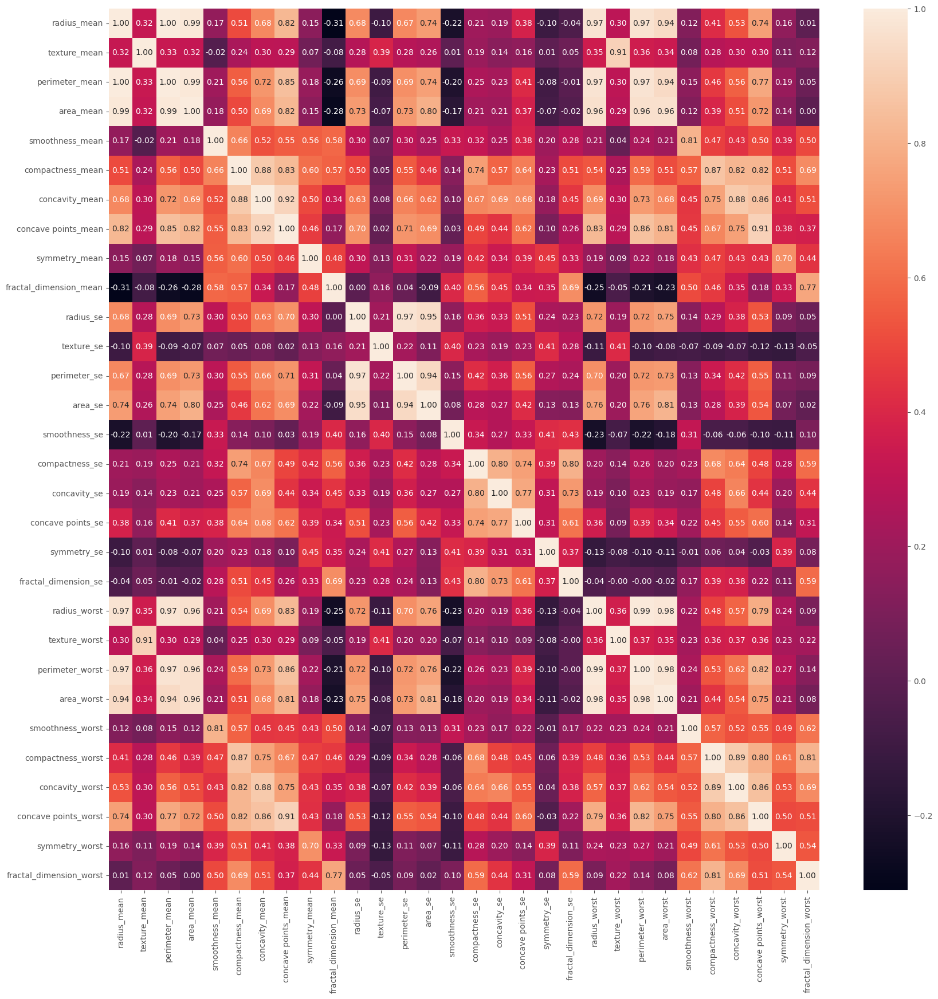

In [19]:
plt.figure(figsize=(20, 20)) 
sns.heatmap(df_data.iloc[:,1:].corr(), annot=True, fmt=".2f")
plt.show() 

In [20]:
round(df_data.iloc[:,1:].corr(method='pearson'), 2) # 'kendall' , 'spearman'

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.00,0.32,1.00,0.99,0.17,0.51,0.68,0.82,0.15,-0.31,...,0.97,0.30,0.97,0.94,0.12,0.41,0.53,0.74,0.16,0.01
texture_mean,0.32,1.00,0.33,0.32,-0.02,0.24,0.30,0.29,0.07,-0.08,...,0.35,0.91,0.36,0.34,0.08,0.28,0.30,0.30,0.11,0.12
perimeter_mean,1.00,0.33,1.00,0.99,0.21,0.56,0.72,0.85,0.18,-0.26,...,0.97,0.30,0.97,0.94,0.15,0.46,0.56,0.77,0.19,0.05
area_mean,0.99,0.32,0.99,1.00,0.18,0.50,0.69,0.82,0.15,-0.28,...,0.96,0.29,0.96,0.96,0.12,0.39,0.51,0.72,0.14,0.00
smoothness_mean,0.17,-0.02,0.21,0.18,1.00,0.66,0.52,0.55,0.56,0.58,...,0.21,0.04,0.24,0.21,0.81,0.47,0.43,0.50,0.39,0.50
compactness_mean,0.51,0.24,0.56,0.50,0.66,1.00,0.88,0.83,0.60,0.57,...,0.54,0.25,0.59,0.51,0.57,0.87,0.82,0.82,0.51,0.69
concavity_mean,0.68,0.30,0.72,0.69,0.52,0.88,1.00,0.92,0.50,0.34,...,0.69,0.30,0.73,0.68,0.45,0.75,0.88,0.86,0.41,0.51
concave points_mean,0.82,0.29,0.85,0.82,0.55,0.83,0.92,1.00,0.46,0.17,...,0.83,0.29,0.86,0.81,0.45,0.67,0.75,0.91,0.38,0.37
symmetry_mean,0.15,0.07,0.18,0.15,0.56,0.60,0.50,0.46,1.00,0.48,...,0.19,0.09,0.22,0.18,0.43,0.47,0.43,0.43,0.70,0.44
fractal_dimension_mean,-0.31,-0.08,-0.26,-0.28,0.58,0.57,0.34,0.17,0.48,1.00,...,-0.25,-0.05,-0.21,-0.23,0.50,0.46,0.35,0.18,0.33,0.77


In [21]:
# size reduction
df_data = df_data.drop(["perimeter_mean", "area_mean", "concave points_mean", "radius_worst", 
                        "area_worst", "perimeter_worst", "texture_worst", "compactness_worst", 
                        "concavity_mean", "concavity_worst", "radius_se", "area_se"], axis=1) 

In [22]:
#verify column are deleted
df_data.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'smoothness_mean',
       'compactness_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'texture_se', 'perimeter_se', 'smoothness_se', 'compactness_se',
       'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'smoothness_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

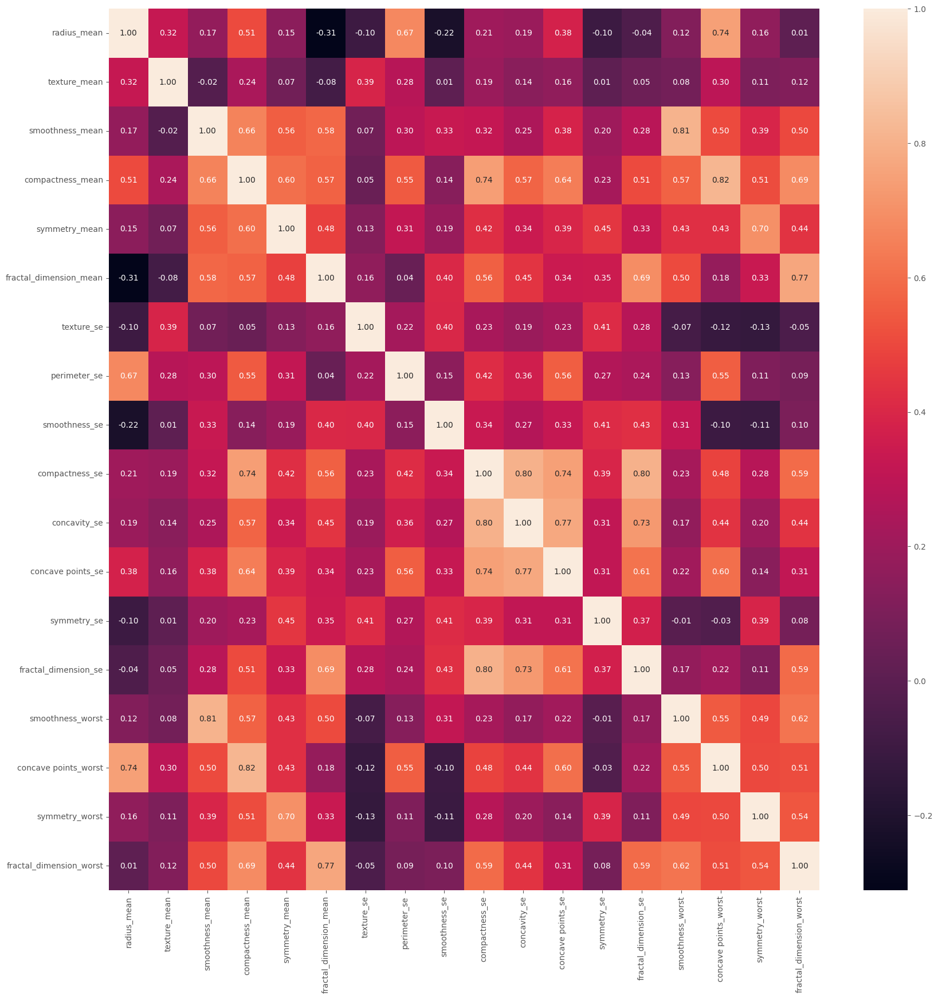

In [23]:
plt.figure(figsize=(20, 20)) 
sns.heatmap(df_data.iloc[:,1:].corr(), annot=True, fmt=".2f")
plt.show()

In [24]:
df_data.dtypes[df_data.dtypes != 'float64']

diagnosis    object
dtype: object

In [25]:
#label encoder
string_sutun = 'diagnosis' 
label_encoder = LabelEncoder()
df_data[string_sutun] = label_encoder.fit_transform(df_data[string_sutun])
df_data.head()

,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,texture_se,perimeter_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,0.11840,0.27760,0.2419,0.07871,0.9053,8.589,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,0.1622,0.2654,0.4601,0.11890
1,1,20.57,17.77,0.08474,0.07864,0.1812,0.05667,0.7339,3.398,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,0.1238,0.1860,0.2750,0.08902
2,1,19.69,21.25,0.10960,0.15990,0.2069,0.05999,0.7869,4.585,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,0.1444,0.2430,0.3613,0.08758
3,1,11.42,20.38,0.14250,0.28390,0.2597,0.09744,1.1560,3.445,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,0.2098,0.2575,0.6638,0.17300
4,1,20.29,14.34,0.10030,0.13280,0.1809,0.05883,0.7813,5.438,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,0.1374,0.1625,0.2364,0.07678


In [26]:
df_data['diagnosis'].value_counts()

diagnosis
0    357
1    212
Name: count, dtype: int64

In [27]:
df_data['diagnosis'].unique()

array([1, 0])

# Model Training

In [28]:
X = df_data.drop("diagnosis", axis = 1).values
y = df_data["diagnosis"].values

In [29]:
# Feature Scaling
sc = StandardScaler()
X = sc.fit_transform(X)

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(398, 18)
(398,)
(171, 18)
(171,)


In [31]:
add_result = {}

In [32]:
def evaluate_models(models, X_train, y_train, X_test, y_test):

    results = []

    for model_name, model in models.items():
        # Fit the model
        
        start = time()
        
        model.fit(X_train, y_train)

        # Make predictions on the test set
        y_pred = model.predict(X_test)
        
        # Predict probabilities on the test set
        y_probs = model.predict_proba(X_test)[:, 1]
        
        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred) 

        # Calculate precision
        precision = precision_score(y_test, y_pred)
        
        speed = np.round(time() - start, 3)
        
        # Compute ROC curve and AUC
        fpr, tpr, thresholds = roc_curve(y_test, y_probs)
        roc_auc = auc(fpr, tpr)
        
        # Plot ROC curve
        plt.figure(figsize=(8, 8))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(model_name + " - " + 'Receiver Operating Characteristic (ROC) Curve')
        plt.legend(loc='lower right')
        
        ConfusionMatrixDisplay.from_predictions(y_test, y_pred, display_labels = ['Benign', 'Malignant'])
        plt.show()
        
        # Store the results
        results.append({
            'Model': model_name,
            'Accuracy': accuracy,
            'Precision': precision,
            'Roc_AUC' : roc_auc,
            'speed' : speed
        })

    return results

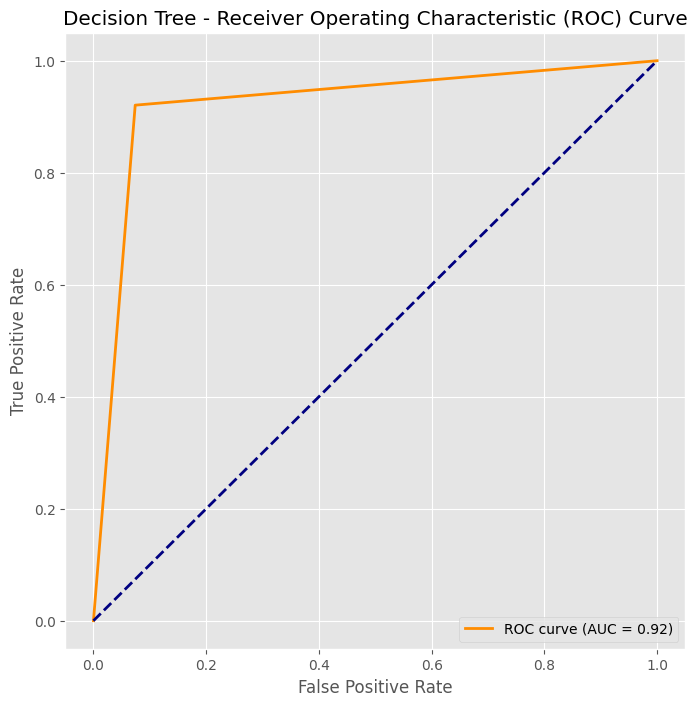

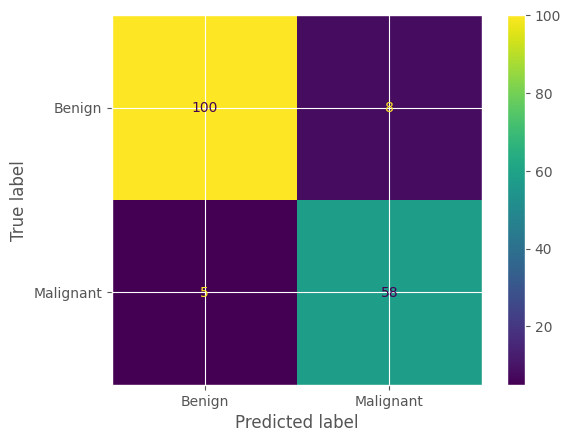

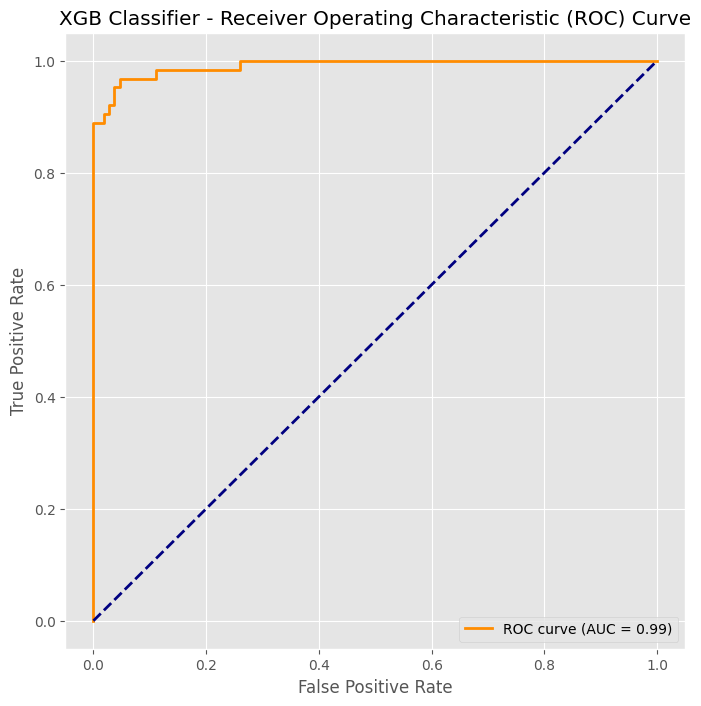

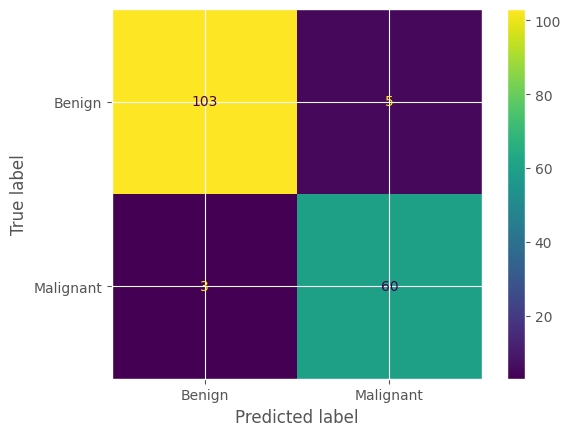

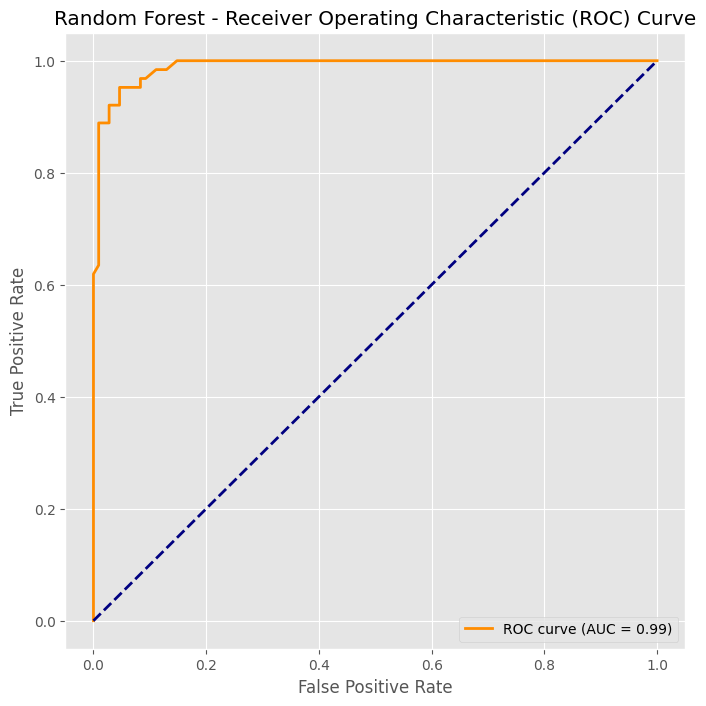

...

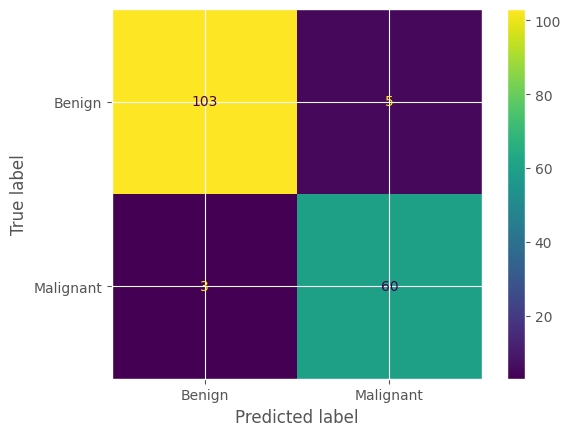

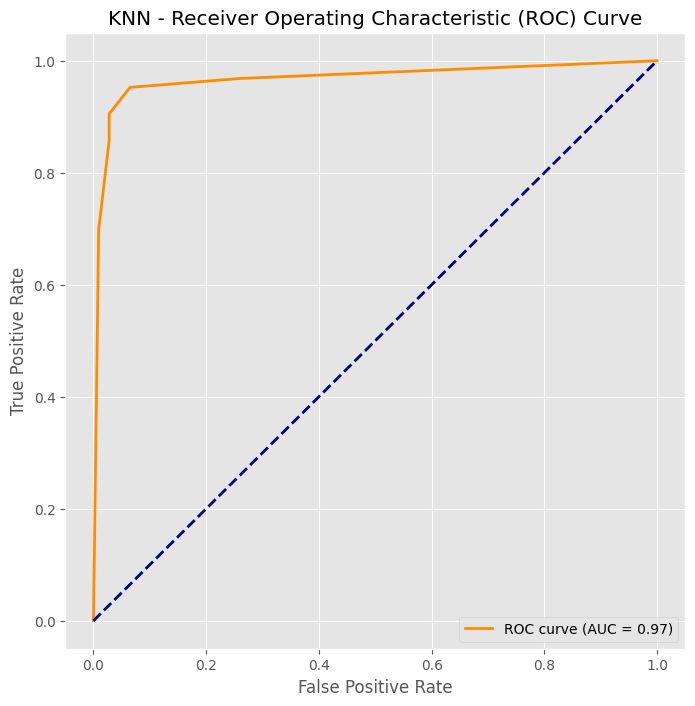

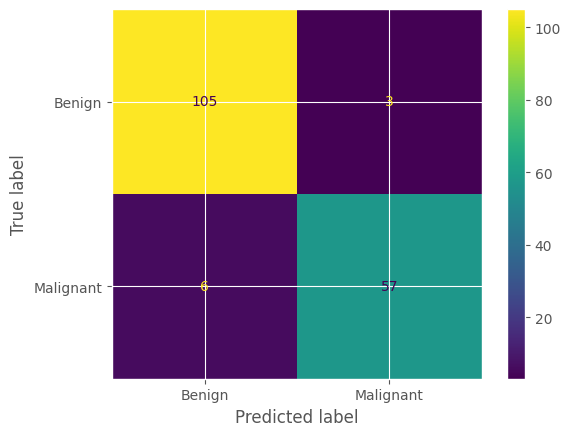

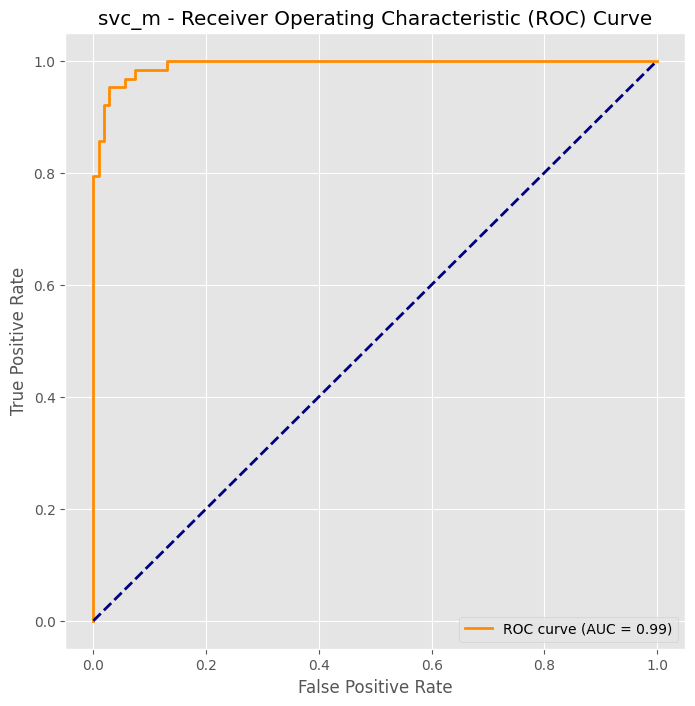

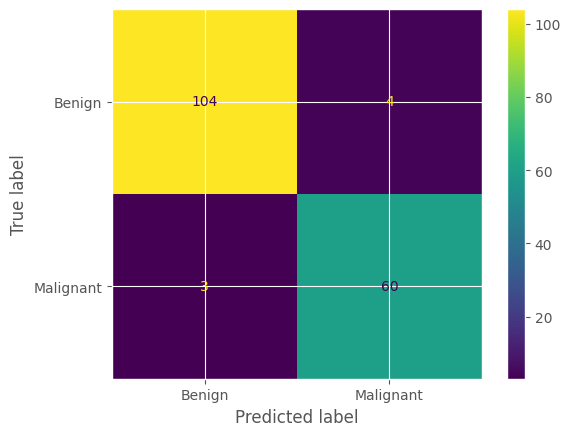

Model: Decision Tree, Accuracy: 0.9240, Precision: 0.8788, ROC_AUC: 0.92 , speed: 0.01

Model: XGB Classifier, Accuracy: 0.9532, Precision: 0.9231, ROC_AUC: 0.99 , speed: 0.10

Model: Random Forest, Accuracy: 0.9415, Precision: 0.9206, ROC_AUC: 0.99 , speed: 0.17

Model: Logistic Regression, Accuracy: 0.9766, Precision: 0.9683, ROC_AUC: 1.00 , speed: 0.01

Model: lda_classifier, Accuracy: 0.9766, Precision: 1.0000, ROC_AUC: 1.00 , speed: 0.01

Model: adaboost, Accuracy: 0.9532, Precision: 0.9231, ROC_AUC: 0.98 , speed: 0.12

Model: KNN, Accuracy: 0.9474, Precision: 0.9500, ROC_AUC: 0.97 , speed: 0.18

Model: svc_m, Accuracy: 0.9591, Precision: 0.9375, ROC_AUC: 0.99 , speed: 0.03



In [33]:
# Define models
models = {
    'Decision Tree': DecisionTreeClassifier(),
    'XGB Classifier': XGBClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(),
    'lda_classifier' : LinearDiscriminantAnalysis(),
    'adaboost' : AdaBoostClassifier() ,
    'KNN' : KNeighborsClassifier() ,
    'svc_m' : SVC(random_state=SEED,
    class_weight="balanced",
    probability=True,)
}

# Call function
results = evaluate_models(models,  X_train, y_train, X_test, y_test)

add_result = results

# Display the results
for result in results:
    print(f"Model: {result['Model']}, Accuracy: {result['Accuracy']:.4f}, Precision: {result['Precision']:.4f}, ROC_AUC: {result['Roc_AUC']:.2f} , speed: {result['speed']:.2f}\n")

In [34]:
data_df_Model_before_tune = pd.DataFrame.from_dict(add_result)
data_df_Model_before_tune['Accuracy%'] = ( data_df_Model_before_tune['Accuracy'] * 100 ).round(3)
data_df_Model_before_tune['Precision%'] = ( data_df_Model_before_tune['Precision'] * 100 ).round(3)
data_df_Model_before_tune['Roc_AUC%'] = ( data_df_Model_before_tune['Roc_AUC'] * 100 ).round(3)
data_df_Model_before_tune

,Model,Accuracy,Precision,Roc_AUC,speed,Accuracy%,Precision%,Roc_AUC%
0,Decision Tree,0.923977,0.878788,0.923280,0.013,92.398,87.879,92.328
1,XGB Classifier,0.953216,0.923077,0.991476,0.104,95.322,92.308,99.148
2,Random Forest,0.941520,0.920635,0.990079,0.175,94.152,92.063,99.008
3,Logistic Regression,0.976608,0.968254,0.995297,0.015,97.661,96.825,99.530
4,lda_classifier,0.976608,1.000000,0.996620,0.012,97.661,100.000,99.662
5,adaboost,0.953216,0.923077,0.983245,0.119,95.322,92.308,98.325
6,KNN,0.947368,0.950000,0.967740,0.179,94.737,95.000,96.774
7,svc_m,0.959064,0.937500,0.993239,0.031,95.906,93.750,99.324


In [35]:
data_df_Model_before_tune.hvplot.barh(x='Model', y='Accuracy%', grid=True, fontsize=14, color='Accuracy%', colorbar=True, width=700)

:Bars   [Model]   (Accuracy%)

In [36]:
data_df_Model_before_tune.hvplot.barh(x='Model', y='Roc_AUC%', grid=True, fontsize=14, color='Roc_AUC%', colorbar=True, width=700)

:Bars   [Model]   (Roc_AUC%)

# Hyper Parameter Tuning

In [37]:
# select parameter and model
models = [
    {
        'name': 'Decision Tree',
        'model': DecisionTreeClassifier(),
        'params': {
            "max_depth": [3, 5, 7, 9, 11, 13],
            'criterion': ['gini', 'entropy']
        }
    },
    {
        'name': 'XGB Classifier',
        'model': XGBClassifier(),
        'params': {
            'learning_rate': [0.01, 0.1, 0.2],
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 4, 5],
            'min_child_weight': [1, 3, 5],
            'subsample': [0.8, 0.9, 1.0],
            'colsample_bytree': [0.8, 0.9, 1.0],
            'gamma': [0, 0.1, 0.2],
            'reg_lambda': [0, 1, 5],
        }
    },
    {
        'name': 'RandomForestClassifier',
        'model': RandomForestClassifier(),
        'params': {
            'max_features': [1,3,10], 
            'min_samples_split':[2,3,10], 
            'min_samples_leaf':[1,3,10], 
            'bootstrap':[False],
            'n_estimators': [100, 200, 300],
            'criterion': ['gini','entropy'],
        }
    },
    {
        'name': 'LogisticRegression',
        'model': LogisticRegression(),
        'params': {
            'max_iter' : [2000], 
            'penalty' : ['l1', 'l2'], 
            'C' : np.logspace(-4, 4, 20),
            'solver' : ['liblinear']
        }
    },
    {
        'name': 'lda_classifier',
        'model': LinearDiscriminantAnalysis(),
        'params': {
            'solver': ['svd', 'lsqr', 'eigen'],
        }
    },
    {
        'name': 'adaboost',
        'model': AdaBoostClassifier(),
        'params': {
            'algorithm': ['SAMME', 'SAMME.R'],
            'n_estimators': [10, 25, 50],
            'learning_rate': [1e-3, 1e-2, 1e-1]
        }
    }, 
    {
        'name': 'KNeighborsClassifier',
        'model': KNeighborsClassifier(),
        'params': {
            'n_neighbors': [2,3,5,7,9],
            'weights': ['uniform', 'distance'],
            'metric':['euclidean','manhattan'],
            'p': [1, 2]
        }
    },
    {
        'name': 'SVC',
        'model': SVC(probability=True,),
        'params': {
            'C': [1,10,50,100,200,300,1000],
            'kernel': ['rbf'],
            'gamma': [0.001, 0.01, 0.1, 1],
        }
    },
]


best_models = []
tindex = 0
for model_info in models:
    start = time()
    
    grid_search = GridSearchCV(model_info['model'], model_info['params'], cv=5, n_jobs=-1) 
    grid_search.fit(X_train, y_train) 
    
    speed = np.round(time() - start, 3)
    
    best_models.append({
        'name': model_info['name'],
        'best_model': grid_search.best_estimator_,
        'best_params': grid_search.best_params_,
        'best_score': grid_search.best_score_,
        'speed' : speed
    })
    tindex = tindex + 1


for best_model in best_models:
    print(f"Model: {best_model['name']} \nBest Parameters: {best_model['best_params']} \nBest Score: {round(best_model['best_score'], 2)}%")
    print("-" * 30)

model_names = []
model_scores = []
model_speed = []
model_parameters = []

for best_model in best_models:
    score = best_model['best_score']
    speed_val = best_model['speed']
    model_estimator = best_model
    if score >= 0:
        model_names.append(best_model['name'])
        model_scores.append(score)
        model_speed.append(speed_val)
        model_parameters.append(best_model['best_params'])

Model: Decision Tree 
Best Parameters: {'criterion': 'gini', 'max_depth': 3} 
Best Score: 0.93%
------------------------------
Model: XGB Classifier 
Best Parameters: {'colsample_bytree': 1.0, 'gamma': 0.2, 'learning_rate': 0.2, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 50, 'reg_lambda': 0, 'subsample': 0.8} 
Best Score: 0.96%
------------------------------
Model: RandomForestClassifier 
Best Parameters: {'bootstrap': False, 'criterion': 'gini', 'max_features': 1, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 100} 
Best Score: 0.96%
------------------------------
Model: LogisticRegression 
Best Parameters: {'C': 0.615848211066026, 'max_iter': 2000, 'penalty': 'l2', 'solver': 'liblinear'} 
Best Score: 0.97%
------------------------------
Model: lda_classifier 
Best Parameters: {'solver': 'svd'} 
Best Score: 0.95%
------------------------------
Model: adaboost 
Best Parameters: {'algorithm': 'SAMME.R', 'learning_rate': 0.1, 'n_estimators': 50} 
Best Score: 

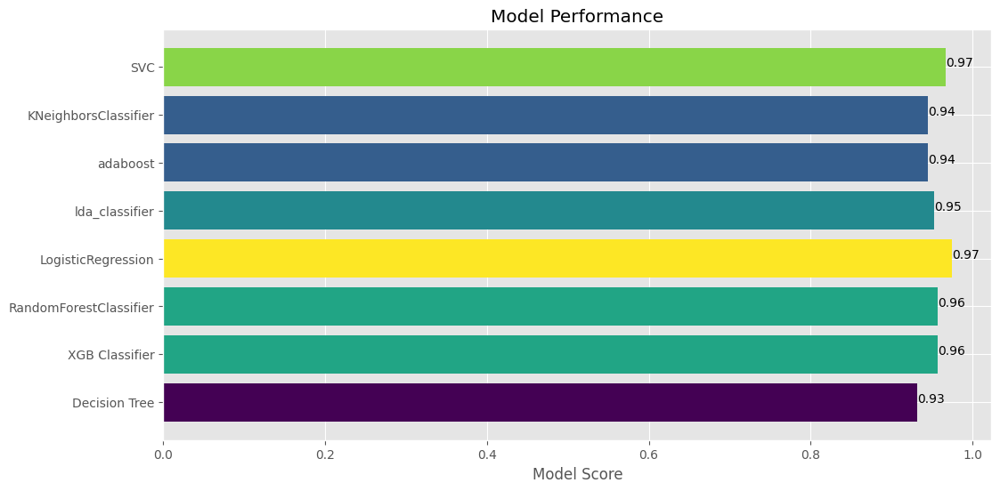

In [38]:
#colors = ['lightblue', 'lightgreen', 'orange', 'red', 'lightyellow', 'cyan', 'magenta']
colormap = 'viridis'

norm = plt.Normalize(min(model_scores), max(model_scores))
colors = plt.cm.get_cmap(colormap)(norm(model_scores))

plt.figure(figsize=(12, 6))
bars = plt.barh(model_names, model_scores, color=colors)

# Add annotations to each bar
for bar in bars:
    yval = round(bar.get_width(),2)
    plt.text(bar.get_width(), bar.get_y() + yval/2, f'{yval}', va='center', ha='left', fontsize=10, color='black')

plt.xlabel('Model Score')
plt.title('Model Performance')
plt.show()

In [39]:
for i in range(0,8):
    print(best_models[i]['name'])

Decision Tree
XGB Classifier
RandomForestClassifier
LogisticRegression
lda_classifier
adaboost
KNeighborsClassifier
SVC


In [40]:
best_dt = best_models[0]['best_model']
best_xgb = best_models[1]['best_model']
best_rf = best_models[2]['best_model']
best_lr = best_models[3]['best_model']
best_lda = best_models[4]['best_model']
best_adaboost = best_models[5]['best_model']
best_knn = best_models[6]['best_model']
best_svc = best_models[7]['best_model']

In [41]:
voting_clf_soft_all = VotingClassifier(estimators = [('DT',best_dt),
                                                     ('xgb', best_xgb),
                                                     ('rf',best_rf),
                                                     ('lr',best_lr),
                                                     ('lda',best_lda),
                                                     ('ADB', best_adaboost),
                                                     ('knn',best_knn),
                                                     ('svc',best_svc)], 
                                                     voting = 'soft') 

voting_clf_hard_all = VotingClassifier(estimators = [('DT',best_dt),
                                                     ('xgb', best_xgb),
                                                     ('rf',best_rf),
                                                     ('lr',best_lr),
                                                     ('lda',best_lda),
                                                     ('ADB', best_adaboost),
                                                     ('knn',best_knn),
                                                     ('svc',best_svc)], 
                                                     voting = 'hard') 

In [42]:
print('voting_clf_soft_all :',cross_val_score(voting_clf_soft_all,X_train,y_train,cv=8,))
print('voting_clf_soft_all mean :',cross_val_score(voting_clf_soft_all,X_train,y_train,cv=8).mean())

print("\n")

print('voting_clf_hard_all :',cross_val_score(voting_clf_hard_all,X_train,y_train,cv=9))
print('voting_clf_hard_all mean :',cross_val_score(voting_clf_hard_all,X_train,y_train,cv=9).mean())

voting_clf_soft_all : [0.98       0.94       0.94       0.96       0.98       0.94
 0.95918367 0.95918367]
voting_clf_soft_all mean : 0.9623469387755101


voting_clf_hard_all : [0.97777778 0.95555556 0.90909091 0.97727273 0.97727273 0.93181818
 0.97727273 0.97727273 0.95454545]
voting_clf_hard_all mean : 0.9597643097643098


In [43]:
voting_clf_soft_all

VotingClassifier(estimators=[('DT', DecisionTreeClassifier(max_depth=3)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=1.0, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0.2,
                                            grow_policy=None,
                                            importance_type=None...
                              RandomForestClassifier(bootstrap=False,
                                                     max_features=1,
                                                     min_samples_split=10)),
                             ('lr',
                              LogisticRegression(C=0.615848211066026,
                                                 max_iter=2000,
                                                 solver='liblinear')),
                             ('lda', LinearDiscriminantAnalysis()),
                             ('ADB', AdaBoostClassifier(learning_rate=0.1)),
                             ('knn',
                              KNeighborsClassifier(metric='euclidean',
                                                   n_neighbors=9, p=1)),
                             ('svc',
                              SVC(C=200, gamma=0.001, probability=True))],
                 voting='soft')

In [47]:
def model_pred(models, parameters, X_train, y_train, X_test, y_test):
    
    results = []
    
    lindex = 0
    
    for model_name, model in models.items():
        
        start = time()
        
        #classifier = model()
        model.fit(X_train, y_train)
        model_run = GridSearchCV(model, param_grid=parameters[lindex]) 
        model_run.fit(X_train, y_train)
        
        predictions = model_run.predict(X_test)
        print('------------------------------------------------------')
        print('Model : {}'.format(model_name))
        print('------------------------------------------------------')
        print(classification_report(y_test, predictions))
        print(confusion_matrix(y_test, predictions))
        print('------------------------------------------------------')
        print('------------------------------------------------------')
        
        # Predict probabilities on the test set
        y_probs = model_run.predict_proba(X_test)[:, 1]
        
        # Calculate accuracy
        accuracy = accuracy_score(y_test, predictions) 

        # Calculate precision
        precision = precision_score(y_test, predictions)
        
        speed = np.round(time() - start, 3)
        
        # Compute ROC curve and AUC
        fpr, tpr, thresholds = roc_curve(y_test, y_probs)
        roc_auc = auc(fpr, tpr)
        
        # Store the results
        results.append({
            'Model': model_name,
            'Accuracy': accuracy,
            'Precision': precision,
            'Roc_AUC' : roc_auc,
            'speed' : speed
        })
        lindex = lindex + 1
    
    return results

In [48]:
# Define models
models = {
    'Decision Tree': DecisionTreeClassifier(),
    'XGB Classifier': XGBClassifier(),
    'Random Forest': RandomForestClassifier(),
    'Logistic Regression': LogisticRegression(),
    'lda_classifier' : LinearDiscriminantAnalysis(),
    'adaboost' : AdaBoostClassifier() ,
    'KNN' : KNeighborsClassifier() ,
    'svc_m' : SVC(probability=True,),
}

hyper_parameter = [{'criterion': ['entropy'], 'max_depth': [3]},
                   {'colsample_bytree': [1.0],
                    'gamma': [0.2],
                    'learning_rate': [0.2],
                    'max_depth': [4],
                    'min_child_weight': [1],
                    'n_estimators': [50],
                    'reg_lambda': [0],
                    'subsample': [0.8]},
                   {'bootstrap': [False],
                    'criterion': ['entropy'],
                    'max_features': [1],
                    'min_samples_leaf': [1],
                    'min_samples_split': [2],
                    'n_estimators': [300]},
                   {'C': [0.615848211066026],
                    'max_iter': [2000],
                    'penalty': ['l2'],
                    'solver': ['liblinear']},
                   {'solver': ['svd']},
                   {'algorithm': ['SAMME.R'], 'learning_rate': [0.1], 'n_estimators': [50]},
                   {'metric': ['euclidean'], 'n_neighbors': [9], 'p': [1], 'weights': ['uniform']},
                   {'C': [200], 'gamma': [0.001], 'kernel': ['rbf']}]

# Call function
results = model_pred(models, hyper_parameter, X_train, y_train, X_test, y_test)

add_result = results

# Display the results
for result in results:
    print(f"Model: {result['Model']}, Accuracy: {result['Accuracy']:.4f}, Precision: {result['Precision']:.4f}, ROC_AUC: {result['Roc_AUC']:.2f} , speed: {result['speed']:.2f}\n")

------------------------------------------------------
Model : Decision Tree
------------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.94      0.96       108
           1       0.91      0.95      0.93        63

    accuracy                           0.95       171
   macro avg       0.94      0.95      0.94       171
weighted avg       0.95      0.95      0.95       171

[[102   6]
 [  3  60]]
------------------------------------------------------
------------------------------------------------------
------------------------------------------------------
Model : XGB Classifier
------------------------------------------------------
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       108
           1       0.92      0.95      0.94        63

    accuracy                           0.95       171
   macro avg       0.95      0.95      0.95       171
wei

In [49]:
#add_result
df_after_tuning = pd.DataFrame.from_dict(add_result)
df_after_tuning['Accuracy%'] = ( df_after_tuning['Accuracy'] * 100 ).round(3)
df_after_tuning['Precision%'] = ( df_after_tuning['Precision'] * 100 ).round(3)
df_after_tuning['Roc_AUC%'] = ( df_after_tuning['Roc_AUC'] * 100 ).round(3)
df_after_tuning

,Model,Accuracy,Precision,Roc_AUC,speed,Accuracy%,Precision%,Roc_AUC%
0,Decision Tree,0.947368,0.909091,0.976411,0.041,94.737,90.909,97.641
1,XGB Classifier,0.953216,0.923077,0.993239,0.324,95.322,92.308,99.324
2,Random Forest,0.947368,0.935484,0.989932,2.441,94.737,93.548,98.993
3,Logistic Regression,0.976608,0.968254,0.996473,0.021,97.661,96.825,99.647
4,lda_classifier,0.976608,1.000000,0.996620,0.020,97.661,100.000,99.662
5,adaboost,0.935673,0.919355,0.987287,0.667,93.567,91.935,98.729
6,KNN,0.941520,0.934426,0.980012,0.080,94.152,93.443,98.001
7,svc_m,0.970760,0.967742,0.994121,0.106,97.076,96.774,99.412


# Voting Classifier

In [50]:
voting_clf_soft_all.fit(X_train, y_train)

VotingClassifier(estimators=[('DT', DecisionTreeClassifier(max_depth=3)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=1.0, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0.2,
                                            grow_policy=None,
                                            importance_type=None...
                              RandomForestClassifier(bootstrap=False,
                                                     max_features=1,
                                                     min_samples_split=10)),
                             ('lr',
                              LogisticRegression(C=0.615848211066026,
                                                 max_iter=2000,
                                                 solver='liblinear')),
                             ('lda', LinearDiscriminantAnalysis()),
                             ('ADB', AdaBoostClassifier(learning_rate=0.1)),
                             ('knn',
                              KNeighborsClassifier(metric='euclidean',
                                                   n_neighbors=9, p=1)),
                             ('svc',
                              SVC(C=200, gamma=0.001, probability=True))],
                 voting='soft')

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       108
           1       0.94      0.95      0.94        63

    accuracy                           0.96       171
   macro avg       0.95      0.96      0.96       171
weighted avg       0.96      0.96      0.96       171

[[104   4]
 [  3  60]]


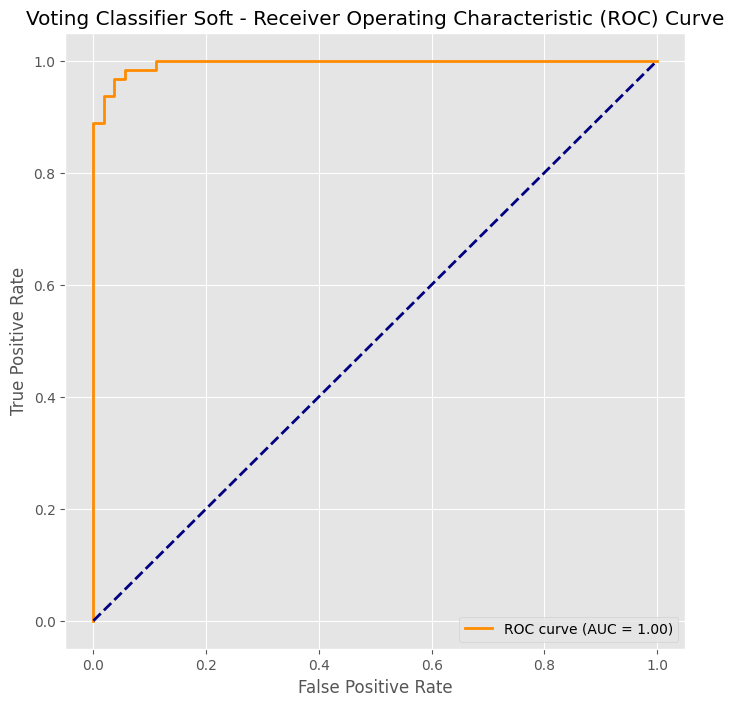

In [65]:
vclf_sft_results = []

start = time()

vclf_sft_y_probs = voting_clf_soft_all.predict_proba(X_test)[:, 1]

predictions_vclf_sft = voting_clf_soft_all.predict(X_test).astype(int)

vclf_sft_accuracy = accuracy_score(y_test, predictions_vclf_sft)
vclf_sft_precision = precision_score(y_test, predictions_vclf_sft)

vclf_sft_fpr, vclf_sft_tpr, vclf_sft_thresholds = roc_curve(y_test, vclf_sft_y_probs)

vclf_sft_roc_auc = auc(vclf_sft_fpr, vclf_sft_tpr)

speed = np.round(time() - start, 3)

vclf_sft_results.append({
    'Model': 'vclf soft',
    'Accuracy': vclf_sft_accuracy,
    'Precision': vclf_sft_precision,
    'roc_auc': vclf_sft_roc_auc,
    'speed' : speed
    })

plt.figure(figsize=(8, 8))
plt.plot(vclf_sft_fpr, vclf_sft_tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {vclf_sft_roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Voting Classifier Soft' + " - " + 'Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')

print(classification_report(y_test, predictions_vclf_sft))
print(confusion_matrix(y_test, predictions_vclf_sft))

plt.show()

In [66]:
vclf_sft_results

[{'Model': 'vclf soft',
  'Accuracy': 0.9590643274853801,
  'Precision': 0.9375,
  'roc_auc': 0.995296884185773,
  'speed': 0.094}]

In [67]:
voting_clf_hard_all.fit(X_train, y_train)

VotingClassifier(estimators=[('DT', DecisionTreeClassifier(max_depth=3)),
                             ('xgb',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=1.0, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            feature_types=None, gamma=0.2,
                                            grow_policy=None,
                                            importance_type=None...
                              RandomForestClassifier(bootstrap=False,
                                                     max_features=1,
                                                     min_samples_split=10)),
                             ('lr',
                              LogisticRegression(C=0.615848211066026,
                                                 max_iter=2000,
                                                 solver='liblinear')),
                             ('lda', LinearDiscriminantAnalysis()),
                             ('ADB', AdaBoostClassifier(learning_rate=0.1)),
                             ('knn',
                              KNeighborsClassifier(metric='euclidean',
                                                   n_neighbors=9, p=1)),
                             ('svc',
                              SVC(C=200, gamma=0.001, probability=True))])

In [68]:
vclf_hrd_results = []

start = time()

#vclf_hrd_y_probs = voting_clf_hard_all.predict_proba(X_test)[:, 1]

predictions_vclf_hrd = voting_clf_hard_all.predict(X_test).astype(int)

vclf_hrd_accuracy = accuracy_score(y_test, predictions_vclf_hrd)
vclf_hrd_precision = precision_score(y_test, predictions_vclf_hrd)


speed = np.round(time() - start, 3)

vclf_hrd_results.append({
    'Model': 'vclf hard',
    'Accuracy': vclf_hrd_accuracy,
    'Precision': vclf_hrd_precision,
    'roc_auc': '',
    'speed' : speed
    })

print(classification_report(y_test, predictions_vclf_hrd))
print(confusion_matrix(y_test, predictions_vclf_hrd))

plt.show()

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       108
           1       0.94      0.94      0.94        63

    accuracy                           0.95       171
   macro avg       0.95      0.95      0.95       171
weighted avg       0.95      0.95      0.95       171

[[104   4]
 [  4  59]]


In [194]:
vclf_hrd_results

[{'Model': 'vclf hard',
  'Accuracy': 0.9532163742690059,
  'Precision': 0.9365079365079365,
  'roc_auc': '',
  'speed': 0.049}]

# Result Comparison

In [196]:
for vclf_hrd_result in vclf_hrd_results:
    vclf_hrd_result

for vclf_sft_result in vclf_sft_results:
    vclf_sft_result
    
hrd_result = pd.DataFrame.from_dict(vclf_hrd_result, orient='index')
sft_result = pd.DataFrame.from_dict(vclf_sft_result, orient='index')
result_compare = pd.concat([hrd_result, sft_result], axis=1).T.reset_index(drop=True)

result_compare
#result_compare.hvplot.barh(x='Model', y='Accuracy', grid=True, fontsize=14, width=700, height=400)

,Model,Accuracy,Precision,roc_auc,speed
0,vclf hard,0.953216,0.936508,,0.049
1,vclf soft,0.959064,0.9375,0.995297,0.094


# Start Fresh to use PCA

In [183]:
df_data

,diagnosis,radius_mean,texture_mean,smoothness_mean,compactness_mean,symmetry_mean,fractal_dimension_mean,texture_se,perimeter_se,smoothness_se,compactness_se,concavity_se,concave points_se,symmetry_se,fractal_dimension_se,smoothness_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,1,17.99,10.38,0.11840,0.27760,0.2419,0.07871,0.9053,8.589,0.006399,0.04904,0.05373,0.01587,0.03003,0.006193,0.16220,0.2654,0.4601,0.11890
1,1,20.57,17.77,0.08474,0.07864,0.1812,0.05667,0.7339,3.398,0.005225,0.01308,0.01860,0.01340,0.01389,0.003532,0.12380,0.1860,0.2750,0.08902
2,1,19.69,21.25,0.10960,0.15990,0.2069,0.05999,0.7869,4.585,0.006150,0.04006,0.03832,0.02058,0.02250,0.004571,0.14440,0.2430,0.3613,0.08758
3,1,11.42,20.38,0.14250,0.28390,0.2597,0.09744,1.1560,3.445,0.009110,0.07458,0.05661,0.01867,0.05963,0.009208,0.20980,0.2575,0.6638,0.17300
4,1,20.29,14.34,0.10030,0.13280,0.1809,0.05883,0.7813,5.438,0.011490,0.02461,0.05688,0.01885,0.01756,0.005115,0.13740,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,1,21.56,22.39,0.11100,0.11590,0.1726,0.05623,1.2560,7.673,0.010300,0.02891,0.05198,0.02454,0.01114,0.004239,0.14100,0.2216,0.2060,0.07115
565,1,20.13,28.25,0.09780,0.10340,0.1752,0.05533,2.4630,5.203,0.005769,0.02423,0.03950,0.01678,0.01898,0.002498,0.11660,0.1628,0.2572,0.06637
566,1,16.60,28.08,0.08455,0.10230,0.1590,0.05648,1.0750,3.425,0.005903,0.03731,0.04730,0.01557,0.01318,0.003892,0.11390,0.1418,0.2218,0.07820
567,1,20.60,29.33,0.11780,0.27700,0.2397,0.07016,1.5950,5.772,0.006522,0.06158,0.07117,0.01664,0.02324,0.006185,0.16500,0.2650,0.4087,0.12400


In [184]:
predictor_x = df_data.drop("diagnosis", axis = 1).values
target_y = df_data["diagnosis"].values

In [185]:
scaler = StandardScaler()
predictor_X_scaled = scaler.fit_transform(predictor_x)

In [186]:
predictor_X_scaled

array([[ 1.09706398, -2.07333501,  1.56846633, ...,  2.29607613,
         2.75062224,  1.93701461],
       [ 1.82982061, -0.35363241, -0.82696245, ...,  1.0870843 ,
        -0.24388967,  0.28118999],
       [ 1.57988811,  0.45618695,  0.94221044, ...,  1.95500035,
         1.152255  ,  0.20139121],
       ...,
       [ 0.70228425,  2.0455738 , -0.84048388, ...,  0.41406869,
        -1.10454895, -0.31840916],
       [ 1.83834103,  2.33645719,  1.52576706, ...,  2.28998549,
         1.91908301,  2.21963528],
       [-1.80840125,  1.22179204, -3.11208479, ..., -1.74506282,
        -0.04813821, -0.75120669]])

# PCA Elbow Method 

In [187]:
# Choosing best KNN parameters
def KNN_Best_Params(x_train, x_test, y_train, y_test):
    
    k_range = list(range(1,31))
    weight_options = ["uniform", "distance"]
    print()
    param_grid = dict(n_neighbors = k_range, weights = weight_options)
    
    knn = KNeighborsClassifier()
    grid = GridSearchCV(knn, param_grid, cv = 10, scoring = "accuracy")
    grid.fit(x_train, y_train)
    
    print("Best training score {} with parameters: {}".format(grid.best_score_, grid.best_params_))
    print()
    
    knn = KNeighborsClassifier(**grid.best_params_)
    knn.fit(x_train, y_train)
    
    y_pred_test = knn.predict(x_test)
    y_pred_train = knn.predict(x_train)
    
    cm_test = confusion_matrix(y_test, y_pred_test)
    cm_train = confusion_matrix(y_train, y_pred_train)
    
    acc_test = accuracy_score(y_test, y_pred_test)
    acc_train = accuracy_score(y_train, y_pred_train)
    print("Test score: {}, train score: {}".format(acc_test, acc_train))
    print()
    print("CM Test")
    print(cm_test)
    print("CM Train")
    print(cm_train)
    
    return grid

In [188]:
from sklearn.decomposition import PCA

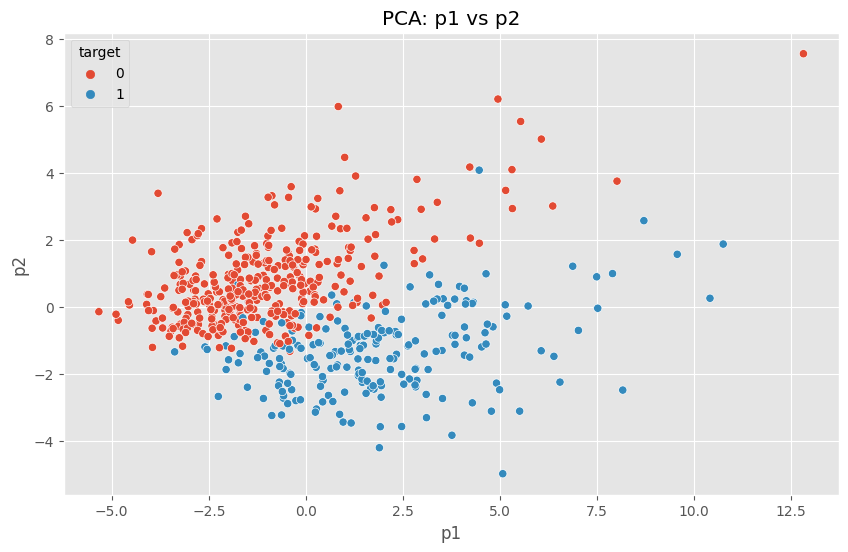

In [189]:
pca = PCA(n_components = 2).fit(predictor_X_scaled)

x_reduced_pca = pca.transform(predictor_X_scaled)

pca_data = pd.DataFrame(x_reduced_pca, columns = ["p1","p2"])

pca_data["target"] = target_y

# visualize PCA
plt.figure(figsize = (10, 6))
sns.scatterplot(x = "p1", y = "p2", hue = "target", data = pca_data)
plt.title("PCA: p1 vs p2")
plt.show()

In [190]:
# Train-test split
x_train_pca, x_test_pca, y_train_pca, y_test_pca = train_test_split(x_reduced_pca, y, test_size = 0.3, random_state = 42)

In [191]:
grid_pca = KNN_Best_Params(x_train_pca, x_test_pca, y_train_pca, y_test_pca)


Best training score 0.9422435897435898 with parameters: {'n_neighbors': 14, 'weights': 'uniform'}

Test score: 0.9415204678362573, train score: 0.9422110552763819

CM Test
[[105   3]
 [  7  56]]
CM Train
[[244   5]
 [ 18 131]]


In [192]:
from matplotlib.colors import ListedColormap

Text(0.5, 1.0, "2-Class classification (k = 14, weights = 'uniform')")

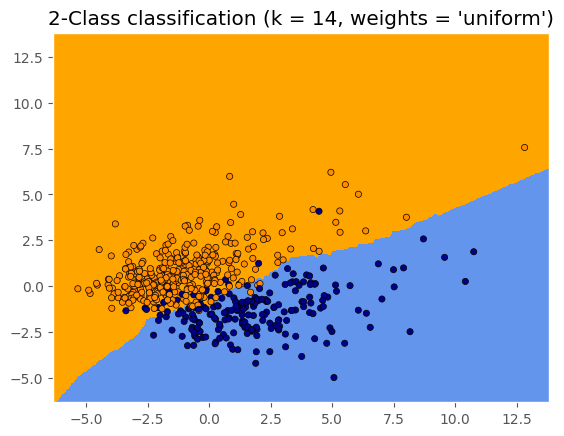

In [193]:
# visualize PCA
cmap_light = ListedColormap(["orange", "cornflowerblue"])
cmap_bold = ListedColormap(["darkorange", "darkblue"])

h = .05
X = x_reduced_pca
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 0].min() - 1, X[:, 0].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))

Z = grid_pca.predict(np.c_[xx.ravel(), yy.ravel()])

# Put the result into a color plot
Z = Z.reshape(xx.shape)
plt.figure()
plt.pcolormesh(xx, yy, Z, cmap = cmap_light)

# plot also the trainin points
plt.scatter(X[:,0], X[:,1], c = y, cmap = cmap_bold, edgecolor = "k", s = 20)
plt.xlim(xx.min(), xx.max())
plt.ylim(yy.min(), yy.max())
plt.title("%i-Class classification (k = %i, weights = '%s')" % (len(np.unique(y)), grid_pca.best_estimator_.n_neighbors, grid_pca.best_estimator_.weights))